In [1]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

%matplotlib inline
import matplotlib.pyplot as plt

from PIL import Image
from matplotlib.pyplot import imshow
import matplotlib.cm as cm

import numpy as np

import skimage.transform
from scipy import ndimage
import scipy.misc

def image_show(image_path):
  imshow(np.asarray(Image.open(image_path, 'r')))
  plt.axis('off')
  plt.show()

import tensorflow as tf
flags = tf.app.flags
FLAGS = flags.FLAGS

#flags.DEFINE_string('model_dir', '/home/gezi/new/temp/image-caption/ai-challenger/model/showattentell.finetune/', '')
  
import sys, os, math
import gezi, melt
import numpy as np

from deepiu.util import algos_factory
from deepiu.seq2seq.rnn_decoder import SeqDecodeMethod

#debug
from deepiu.util import text2ids

TEXT_MAX_WORDS = 100    
decode_max_words = 20


from deepiu.util import ids2text
vocab_path = '/home/gezi/new/temp/image-caption/ai-challenger/tfrecord/seq-basic-finetune/vocab.txt'
ids2text.init(vocab_path)

image_dir = image_dir = '/home/gezi/data2/data/ai_challenger/image_caption/pic/'
image_file = '6275b5349168ac3fab6a493c509301d023cf39d3.jpg'
image_path = os.path.join(image_dir, image_file)
image_model_checkpoint_path = '/home/gezi/data/image_model_check_point/inception_resnet_v2_2016_08_30.ckpt'
net = melt.image.get_imagenet_from_checkpoint(FLAGS.image_checkpoint_file)
print('image net', net, 'net.default_image_size', net.default_image_size)
FLAGS.image_model_name = FLAGS.image_model_name or net.name
FLAGS.image_height = FLAGS.image_height or net.default_image_size
FLAGS.image_width = FLAGS.image_width or net.default_image_size
image_model_name = FLAGS.image_model_name

#model_dir = '/home/gezi/new/temp/image-caption/ai-challenger/model/showattentell2.finetune/'
model_dir = '/home/gezi/new/temp/image-caption/ai-challenger/model.v4/showattentell.coverage.finetune/epoch/model.ckpt-13.60-446216'
#model_dir = '/home/gezi/new/temp/image-caption/ai-challenger/model.v4/showattentell.coverage.keywords'
FLAGS.model_dir = model_dir


if not melt.varname_in_checkpoint(image_model_name, model_dir):
  image_model = melt.image.ImageModel(image_model_checkpoint_path)
else:
  image_model = None

import libpinyin
pinyin = libpinyin.Pinyin()
pinyin.Load('./data/pinyin/')

tensorflow_version: 1.4.0-rc1


INFO:tensorflow:Initializing vocabulary from file: /home/gezi/new/temp/image-caption/ai-challenger/tfrecord/seq-basic-finetune/vocab.txt
INFO:tensorflow:Created vocabulary with 10148 words
image net <function inception_resnet_v2 at 0x7fbdecbdff50> net.default_image_size 299


ENCODE_UNK 1


In [2]:
if 'coverage' in model_dir:
  FLAGS.coverage_attention_wrapper = True

FLAGS.image_encoder = 'Rnn'
FLAGS.showtell_encode_scope = 'encode'
FLAGS.showtell_decode_scope = 'decode'
FLAGS.image_endpoint_feature_name = 'attention'
FLAGS.image_checkpoint_file = image_model_checkpoint_path 
FLAGS.pre_calc_image_feature = False
FLAGS.finetune_image_model = True 
FLAGS.image_features_batch_norm = True 
FLAGS.emb_dim = 512 
FLAGS.rnn_hidden_size = 512 
FLAGS.alignment_history = True

FLAGS.image_attention_size = FLAGS.image_attention_size or melt.image.get_num_features(FLAGS.image_model_name)
FLAGS.image_feature_len = FLAGS.image_feature_len or melt.image.get_feature_dim(FLAGS.image_model_name) * FLAGS.image_attention_size

beam_size = 10
length_normalization_factor = 0.25

In [3]:
algo = 'show_and_tell'
global_scope = algo
main_scope = 'main'
melt.apps.image_processing.init()
with tf.variable_scope(global_scope):
  with tf.variable_scope(main_scope):
    predictor =  algos_factory.gen_predictor(algo)
    predictor.init_predict_text(decode_method=SeqDecodeMethod.ingraph_beam, 
                                beam_size=beam_size,
                                length_normalization_factor=length_normalization_factor,
                                logprobs_history=True,
                                alignment_history=True)  

predictor.load(FLAGS.model_dir) 

cell: <class 'tensorflow.python.ops.rnn_cell_impl.BasicLSTMCell'>
cell: <class 'tensorflow.python.ops.rnn_cell_impl.BasicLSTMCell'>
rnn decoder gen only mode
preprocessing_fn net_name inception_resnet_v2 height 299 width 299


INFO:tensorflow:Scale of 0 disables regularizer.
INFO:tensorflow:Scale of 0 disables regularizer.


image_model will get feature_name Conv2d_7b_1x1
image_feature: Tensor("show_and_tell/main/encode/Flatten/flatten/Reshape:0", shape=(?, 98304), dtype=float32)
use melt.seq2seq.CoverageBahdanauAttention


INFO:tensorflow:Restoring parameters from /home/gezi/new/temp/image-caption/ai-challenger/model.v4/showattentell.coverage.finetune/epoch/model.ckpt-13.60-446216


restore ok: /home/gezi/new/temp/image-caption/ai-challenger/model.v4/showattentell.coverage.finetune/epoch/model.ckpt-13.60-446216
load model ok /home/gezi/new/temp/image-caption/ai-challenger/model.v4/showattentell.coverage.finetune/epoch/model.ckpt-13.60-446216 duration: 4.3593981266


In [4]:
def simple_predict(image_path, predictor):
  timer = gezi.Timer('beam search using time')
  img = melt.read_image(image_path)
  if image_model:
    #attention model gen features only
    feature = image_model.gen_features(img) if image_model is not None else img
  else:
    feature = [img]    
  #texts_list, scores_list = predictor.predict_text(feature)
  #timer.print()
  logprobs_history = None 
  alignment_history = None

  l = predictor.predict_text(feature)
  timer.print()
  texts_list, scores_list= l[0], l[1]
  try:
    logprobs_history = l[2]
    alignment_history = l[3]
  except Exception:
    pass

  #print(alignment_history)

  texts = texts_list[0]
  scores = scores_list[0]
  if logprobs_history is not None:
    logprobs = logprobs_history[0]
  else:
    logprobs = [None] * len(texts)
  if alignment_history is not None:
    alignments = alignment_history[0]
  else:
    alignments = [None] * len(texts)
    
  logprob = None 
  alignment = None 
    
  for text, score, logprob, alignment in zip(texts, scores, logprobs, alignments):
    print('align shape', alignment.shape)
    print(ids2text.ids2text(text), score)
    print(text, len(text))
    if logprob is not None:
      print(map(math.exp, logprob))
    #if alignment is not None:
    #  print(alignment)
    #  print(alignment[10], alignment[11], alignment[12])


In [5]:
#simple_predict(image_path, predictor)

In [6]:
def predict(image_path, predictor, length_normalization_factor=0.25, num_show=1):
  img = melt.read_image(image_path)
  if image_model:
    feature = image_model.gen_feature(img) if image_model is not None else img
  else:
    feature = [img]

  timer = gezi.Timer()
  texts, scores, logprobs_history, alignment_history = predictor.predict_text(feature)
  for i, (text, score, logprob, alignment) in enumerate(zip(texts[0], scores[0], logprobs_history[0], alignment_history[0])):
    print(ids2text.ids2text(text), score)

    # Plot images with attention weights
    words = ids2text.ids2words(text) 
    img = ndimage.imread(image_path)
    
    num_features = melt.image.get_num_features(image_model_name)
    dim = int(np.sqrt(num_features))
    #print('dim:', dim)

    n_words = len(words)
    n_words += 1 #for ori image
    w = np.round(np.sqrt(n_words))
    h = np.ceil(np.float32(n_words) / w)
    
    #print(n_words, w, h)
            
    plt.subplot(w, h, 1)
    plt.imshow(img)
    plt.axis('off')

    #img = scipy.misc.imresize(img, (dim, dim))  

    #smooth = True  #TODO smooth = Ture seems not work not back ground pic
    smooth = False
    if i < 10:  
      print('probs', [math.exp(x) for x in logprob])
      for j in range(len(words)):
        #if i == 0:
        #  print(i, j, words[j], alignment[j])
        plt.subplot(w, h, j + 2)
        lab = pinyin.Convert(words[j].decode('utf8').encode('gbk'))
        lab += '(%0.2f)'%math.exp(logprob[j])
        plt.text(0, 1, lab, backgroundcolor='white', fontsize=10)
        plt.text(0, 1, lab, color='black', fontsize=10)
        plt.imshow(img)
        if smooth:
          alpha_img = skimage.transform.pyramid_expand(alignment[j].reshape(dim, dim), upscale=16, sigma=20)
        else:
          alpha_img = skimage.transform.resize(alignment[j].reshape(dim, dim), [img.shape[0], img.shape[1]])
        plt.imshow(alpha_img, alpha=0.8)
        plt.set_cmap(cm.Greys_r)
        plt.axis('off')
      plt.show()
      #plt.savefig('test%d.pdf'%i)

    print('beam search using time(ms):', timer.elapsed_ms())

In [ ]:
%%html
<style>
.output_wrapper, .output {
    height:auto !important;
    max-height:10000px;  /* your desired max-height here */
}
.output_scroll {
    box-shadow:none !important;
    webkit-box-shadow:none !important;
}
</style>

image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: /home/gezi/data2/data/shijuezhongguo/pic/zouhongjian1.jpg


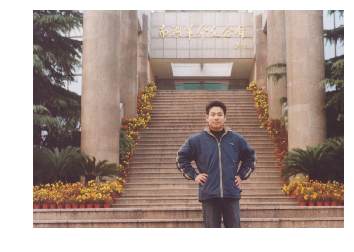

一个 双手 叉腰 的 男人 站 在 室外 的 台阶 上 </S> 0.204523
probs [0.5561089236252236, 0.8870916178994988, 0.5436249503445687, 0.9559598585709163, 0.9783161474002028, 0.9353362445822935, 0.999283231809145, 0.322259201973364, 0.9913514753459441, 0.8659083980456274, 0.8046194163319806, 0.9991928898221039, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


/usr/local/lib/python2.7/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


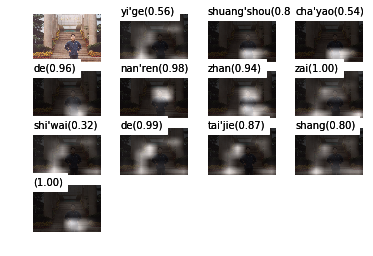

beam search using time(ms): 3686.80000305
一个 双手 叉 着 腰 的 男人 站 在 室外 的 台阶 上 </S> 0.17861
probs [0.5561089236252236, 0.8870916178994988, 0.3257365245062034, 0.9456459819648282, 0.9979269652458389, 0.9864619442498163, 0.9730024165709452, 0.9476468688951422, 0.9980168410258682, 0.3597274546677312, 0.9942046856848634, 0.8773142763853231, 0.8274653574401544, 0.999488139021293, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


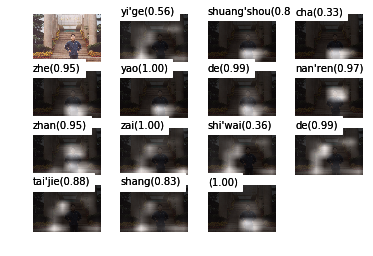

beam search using time(ms): 2119.12703514
一个 双手 叉腰 的 男人 站 在 房屋 外 的 台阶 上 </S> 0.112025
probs [0.5561089236252236, 0.8870916178994988, 0.5436249503445687, 0.9559598585709163, 0.9783161474002028, 0.9353362445822935, 0.999283231809145, 0.20849303656352014, 0.5366301371611817, 0.9961459734214425, 0.75939862580837, 0.7897215610907568, 0.9994893299229335, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


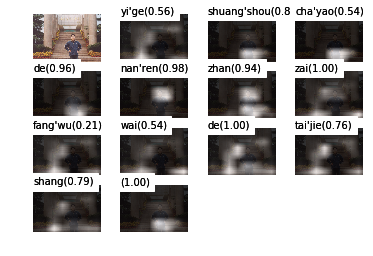

beam search using time(ms): 1976.43303871
室外 的 台阶 上 站 着 一个 双手 叉腰 的 男人 </S> 0.111538
probs [0.16388224924598976, 0.6433318590973468, 0.779654034605952, 0.42923726644759935, 0.8633970764339294, 0.9997667618366811, 0.8232743205676262, 0.9570795549071819, 0.7207602038442912, 0.9898508697220864, 0.9872237458168769, 0.9979542706890361, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


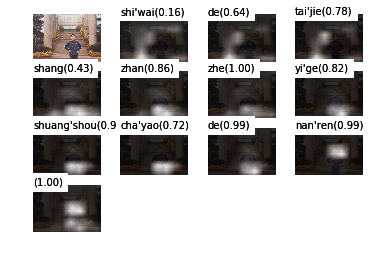

beam search using time(ms): 1830.17206192
一个 双手 叉 着 腰 的 男人 站 在 屋外 的 台阶 上 </S> 0.110141
probs [0.5561089236252236, 0.8870916178994988, 0.3257365245062034, 0.9456459819648282, 0.9979269652458389, 0.9864619442498163, 0.9730024165709452, 0.9476468688951422, 0.9980168410258682, 0.1458072816816525, 0.9960610467753512, 0.847503379235123, 0.8279468929587498, 0.9995345852367465, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


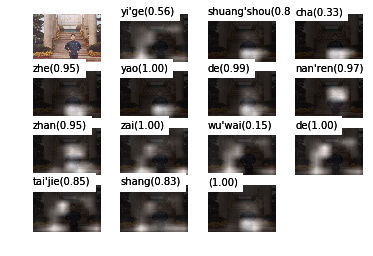

beam search using time(ms): 2130.77783585
室外 的 台阶 旁站 着 一个 双手 叉腰 的 男人 </S> 0.0973079
probs [0.16388224924598976, 0.6433318590973468, 0.779654034605952, 0.3098191190429916, 0.9997992918553742, 0.8597257360732412, 0.9322098706240897, 0.7195128263315805, 0.9898768004340407, 0.9899333390794017, 0.9983112767961232, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


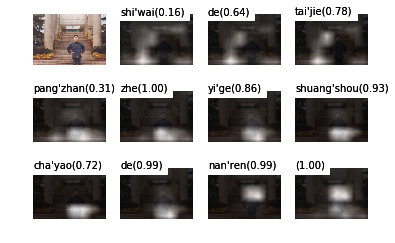

beam search using time(ms): 1707.30113983
一个 双手 叉腰 的 男人 站 在 房屋 前 的 台阶 上 </S> 0.0964283
probs [0.5561089236252236, 0.8870916178994988, 0.5436249503445687, 0.9559598585709163, 0.9783161474002028, 0.9353362445822935, 0.999283231809145, 0.20849303656352014, 0.3986063859392361, 0.994939790589358, 0.67168390541471, 0.9052777681648546, 0.9995289876415802, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


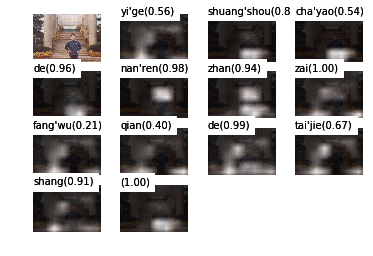

beam search using time(ms): 1978.06286812
室外 有 一个 双手 叉腰 的 男人 站 在 台阶 上 </S> 0.0847275
probs [0.16388224924598976, 0.23442245539363366, 0.9705824222271124, 0.9478494603785412, 0.5365649863499891, 0.9819951336017196, 0.9858519119031354, 0.942788739111411, 0.9981570891142151, 0.8401056717711968, 0.7011413542926394, 0.9936403569566559, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


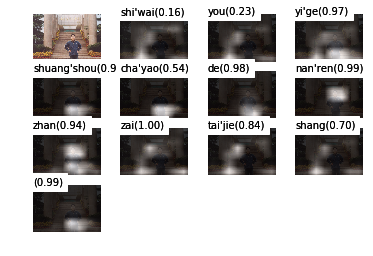

beam search using time(ms): 1829.35094833
一个 双手 叉 着 腰 的 男人 站 在 房屋 外 的 台阶 上 </S> 0.0755761
probs [0.5561089236252236, 0.8870916178994988, 0.3257365245062034, 0.9456459819648282, 0.9979269652458389, 0.9864619442498163, 0.9730024165709452, 0.9476468688951422, 0.9980168410258682, 0.12130601260827262, 0.5799221341671229, 0.9859764763955721, 0.7948336917767136, 0.8177555118214771, 0.9996606071757228, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


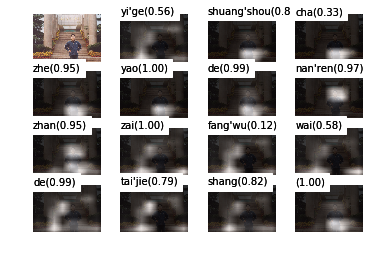

beam search using time(ms): 2259.5500946
一个 双手 叉腰 的 男人 站 在 室外 的 台阶 前 </S> 0.0695637
probs [0.5561089236252236, 0.8870916178994988, 0.5436249503445687, 0.9559598585709163, 0.9783161474002028, 0.9353362445822935, 0.999283231809145, 0.322259201973364, 0.9913514753459441, 0.8659083980456274, 0.10823080113870953, 0.99809592615188, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


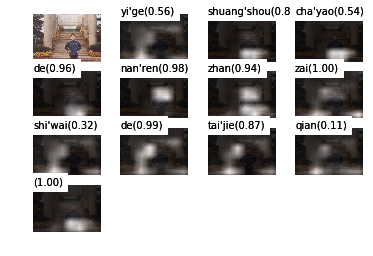

beam search using time(ms): 1847.92995453
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: 743e12038dcf7dbc68123ca7dff9d6d66eb09ea1


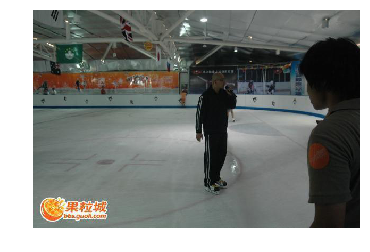

宽敞 的 滑冰场 上 有 两个 穿着 黑色 衣服 的 人 在 滑冰 </S> 0.0120893
probs [0.27040214654133343, 0.9960235563389046, 0.3194629429156819, 0.626963826108476, 0.5585705908977658, 0.3696045930448995, 0.37454747696583046, 0.3814486065680723, 0.519970047605545, 0.9972838231034392, 0.8169785920157373, 0.9723110790772374, 0.3012554220463812, 0.9891716668071112, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


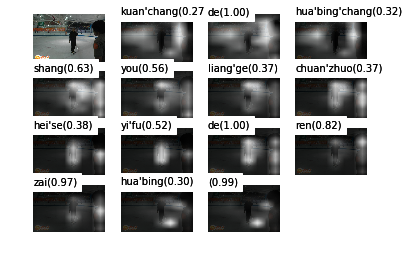

beam search using time(ms): 1515.60497284
宽敞 的 溜冰场 上 有 两个 穿着 黑色 衣服 的 人 在 打 保龄球 </S> 0.00941533
probs [0.27040214654133343, 0.9960235563389046, 0.1532795565969937, 0.7325592095837777, 0.47256860979529186, 0.3850571229050066, 0.3996859240991811, 0.3402159519255845, 0.5730537235219922, 0.9973267444774903, 0.8381003064196735, 0.9757906755861668, 0.44598933113493605, 0.6650905870460695, 0.9921302381813727, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


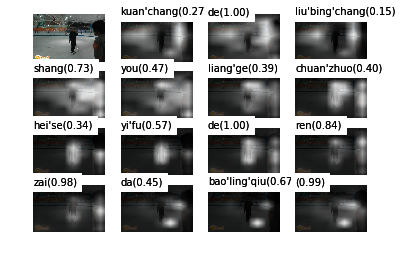

beam search using time(ms): 1381.90603256
宽敞 的 滑冰场 上 有 两个 穿着 深色 衣服 的 人 在 滑冰 </S> 0.00926508
probs [0.27040214654133343, 0.9960235563389046, 0.3194629429156819, 0.626963826108476, 0.5585705908977658, 0.3696045930448995, 0.37454747696583046, 0.2794399356238239, 0.5008080558173579, 0.9969380959871371, 0.763925988987335, 0.9705130267455335, 0.2732796392718819, 0.990031244578798, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


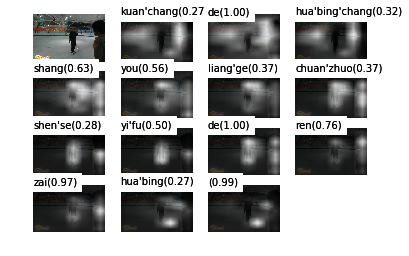

beam search using time(ms): 887.989997864
宽敞 的 滑冰场 上 有 两个 穿着 黑色 衣服 的 人 在 打 保龄球 </S> 0.00923614
probs [0.27040214654133343, 0.9960235563389046, 0.3194629429156819, 0.626963826108476, 0.5585705908977658, 0.3696045930448995, 0.37454747696583046, 0.3814486065680723, 0.519970047605545, 0.9972838231034392, 0.8169785920157373, 0.9723110790772374, 0.28323953361184495, 0.5379832659191764, 0.9923600439048519, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


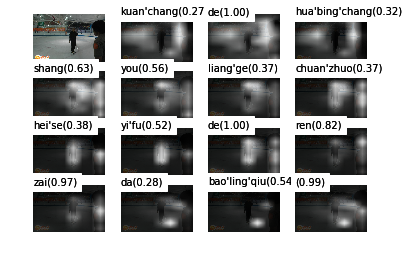

beam search using time(ms): 942.705869675
两个 穿着 黑色 衣服 的 人 站 在 宽敞 的 溜冰场 上 </S> 0.00611053
probs [0.0885140550480096, 0.4313820113100053, 0.38134244371656495, 0.49487555540420936, 0.9866908721464586, 0.803000403008371, 0.317586113669009, 0.9969925998825874, 0.37336826756178326, 0.9885501242273862, 0.21377437069607144, 0.7203019164452615, 0.6086951940185217, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


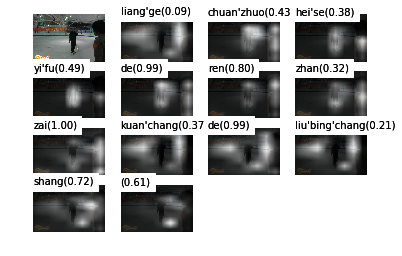

beam search using time(ms): 823.927164078
一个 穿着 黑色 衣服 的 人 和 一个 穿着 黑色 衣服 的 人 站 在 宽敞 的 大厅 内 </S> 0.00366441
probs [0.12953104636837867, 0.31858948804522275, 0.5477687513619542, 0.6993399606580136, 0.9903947641044374, 0.3700118904177152, 0.5626771723020838, 0.9231193467423666, 0.5011498410588073, 0.5293907780302219, 0.8626488662369838, 0.9981259723089027, 0.7472032475686216, 0.4167873117075087, 0.9976458073467683, 0.3250283998822705, 0.9871409147276677, 0.24767612351607413, 0.61680460311122, 0.673965189013934, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


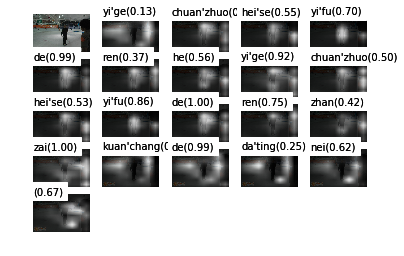

beam search using time(ms): 1210.66379547
一个 穿着 黑色 衣服 的 人 和 一个 穿着 黑色 衣服 的 人 在 滑冰场 上 滑冰 </S> 0.00335134
probs [0.12953104636837867, 0.31858948804522275, 0.5477687513619542, 0.6993399606580136, 0.9903947641044374, 0.3700118904177152, 0.5626771723020838, 0.9231193467423666, 0.5011498410588073, 0.5293907780302219, 0.8626488662369838, 0.9981259723089027, 0.7472032475686216, 0.5208629362138137, 0.12426130487059547, 0.738940842892434, 0.32618124654663677, 0.9971588736838676, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


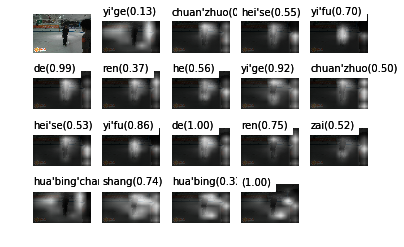

beam search using time(ms): 1100.78501701
一个 穿着 黑色 衣服 的 人 和 一个 穿着 黑色 衣服 的 人 站 在 滑冰场 上 </S> 0.00330868
probs [0.12953104636837867, 0.31858948804522275, 0.5477687513619542, 0.6993399606580136, 0.9903947641044374, 0.3700118904177152, 0.5626771723020838, 0.9231193467423666, 0.5011498410588073, 0.5293907780302219, 0.8626488662369838, 0.9981259723089027, 0.7472032475686216, 0.4167873117075087, 0.9976458073467683, 0.1133317011483304, 0.8621111643052396, 0.3729298892581627, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


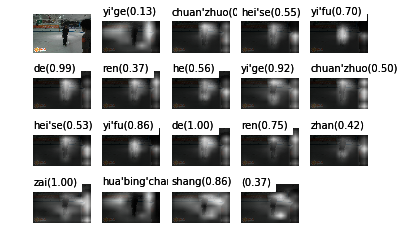

beam search using time(ms): 1102.50306129
一个 穿着 黑色 衣服 的 人 和 一个 穿着 黑色 衣服 的 人 站 在 宽敞 的 大厅 里 </S> 0.00282909
probs [0.12953104636837867, 0.31858948804522275, 0.5477687513619542, 0.6993399606580136, 0.9903947641044374, 0.3700118904177152, 0.5626771723020838, 0.9231193467423666, 0.5011498410588073, 0.5293907780302219, 0.8626488662369838, 0.9981259723089027, 0.7472032475686216, 0.4167873117075087, 0.9976458073467683, 0.3250283998822705, 0.9871409147276677, 0.24767612351607413, 0.37910966782752664, 0.6344759630282066, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


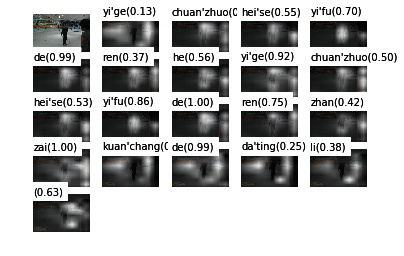

beam search using time(ms): 1214.14589882
一个 穿着 黑色 衣服 的 人 和 一个 穿着 黑色 衣服 的 人 站 在 宽敞 的 运动场 上 </S> 0.00278066
probs [0.12953104636837867, 0.31858948804522275, 0.5477687513619542, 0.6993399606580136, 0.9903947641044374, 0.3700118904177152, 0.5626771723020838, 0.9231193467423666, 0.5011498410588073, 0.5293907780302219, 0.8626488662369838, 0.9981259723089027, 0.7472032475686216, 0.4167873117075087, 0.9976458073467683, 0.3250283998822705, 0.9871409147276677, 0.10283906222411437, 0.825078684109455, 0.6769419608046782, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


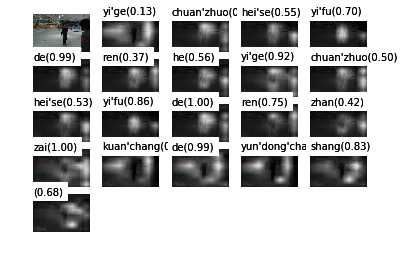

beam search using time(ms): 1210.01601219
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: 074f75f67be5e3e0dfc8364ada63d6501a0937ec


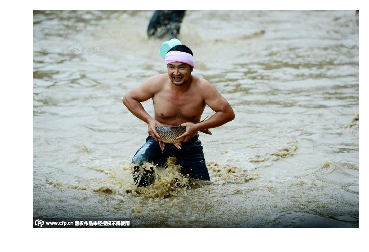

一个 双手 拿 着 鱼 的 男人 站 在 河水 里 </S> 0.0805998
probs [0.6614434258088167, 0.30667812639766656, 0.7808834871301555, 0.9988803300604447, 0.7927348899145971, 0.9446134937950061, 0.9829667772997465, 0.6316775153785741, 0.9989436115574833, 0.13586474380983132, 0.944034876144884, 0.9775319133389259, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


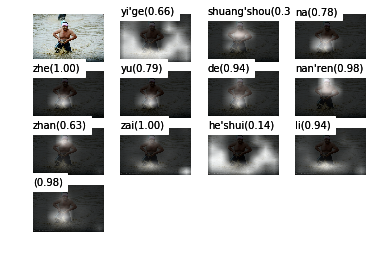

beam search using time(ms): 1756.46400452
一个 双手 拿 着 鱼 的 男人 站 在 浑浊 的 水里 </S> 0.0786419
probs [0.6614434258088167, 0.30667812639766656, 0.7808834871301555, 0.9988803300604447, 0.7927348899145971, 0.9446134937950061, 0.9829667772997465, 0.6316775153785741, 0.9989436115574833, 0.219259419717835, 0.975435187243454, 0.5116189674825437, 0.994718814967704, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


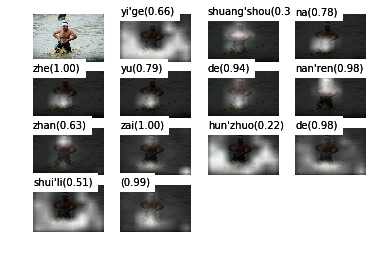

beam search using time(ms): 1158.90479088
一个 双手 拿 着 鱼 的 男人 站 在 水里 </S> 0.0688913
probs [0.6614434258088167, 0.30667812639766656, 0.7808834871301555, 0.9988803300604447, 0.7927348899145971, 0.9446134937950061, 0.9829667772997465, 0.6316775153785741, 0.9989436115574833, 0.11782550502602665, 0.8843798316988669, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


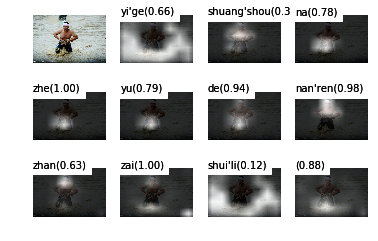

beam search using time(ms): 1468.12605858
一个 双手 拿 着 鱼 的 男人 站 在 浑浊 的 河水 里 </S> 0.0624228
probs [0.6614434258088167, 0.30667812639766656, 0.7808834871301555, 0.9988803300604447, 0.7927348899145971, 0.9446134937950061, 0.9829667772997465, 0.6316775153785741, 0.9989436115574833, 0.219259419717835, 0.975435187243454, 0.3038037490926678, 0.9803094544809388, 0.9987184756524922, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


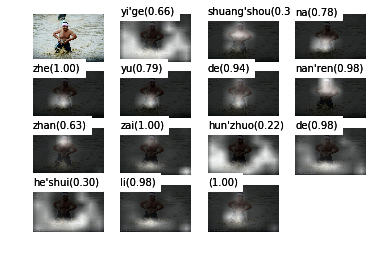

beam search using time(ms): 1247.95103073
浑浊 的 河水 里 站 着 一个 双手 拿 着 鱼 的 男人 </S> 0.0624069
probs [0.048029817830053535, 0.9923333961311409, 0.4888482088826904, 0.9635023563599096, 0.6239092345723921, 0.9992628766714317, 0.6245301161879182, 0.8584924566840266, 0.7296048122747141, 0.9846038273708017, 0.9144957261820033, 0.9743716315853419, 0.9744861808292722, 0.9982901296278176, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


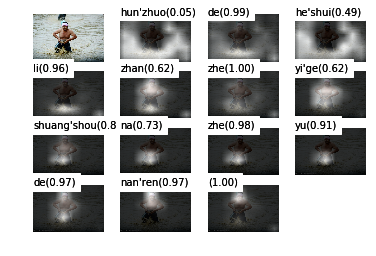

beam search using time(ms): 1247.21503258
一个 双手 拿 着 鱼 的 男人 面带笑容 地站 在 水里 </S> 0.0541099
probs [0.6614434258088167, 0.30667812639766656, 0.7808834871301555, 0.9988803300604447, 0.7927348899145971, 0.9446134937950061, 0.9829667772997465, 0.12870909967406577, 0.9193387964810873, 0.9952047844101587, 0.32988672928331014, 0.9700700499377466, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


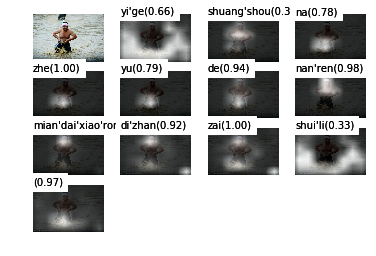

beam search using time(ms): 1076.91192627
一个 戴着 帽子 双手 拿 着 鱼 的 男人 站 在 水里 </S> 0.0524261
probs [0.6614434258088167, 0.2845189597708028, 0.5373423540263216, 0.21840645680391274, 0.8003149919299886, 0.9989831069619683, 0.8713399036454761, 0.9653447039436341, 0.9726900089264398, 0.8149017829066371, 0.998851071096114, 0.31982421148763646, 0.9847774396239986, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


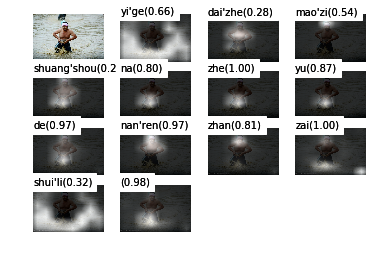

beam search using time(ms): 1158.66994858
一个 双手 拿 着 鱼 的 男人 站 在 河里 </S> 0.0482461
probs [0.6614434258088167, 0.30667812639766656, 0.7808834871301555, 0.9988803300604447, 0.7927348899145971, 0.9446134937950061, 0.9829667772997465, 0.6316775153785741, 0.9989436115574833, 0.06525006812585687, 0.8347583010733626, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


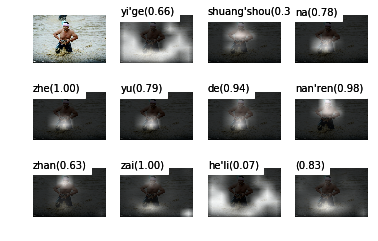

beam search using time(ms): 991.779088974
一个 双手 拿 着 鱼 的 男人 站 在 布满 积水 的 道路 上 </S> 0.0469472
probs [0.6614434258088167, 0.30667812639766656, 0.7808834871301555, 0.9988803300604447, 0.7927348899145971, 0.9446134937950061, 0.9829667772997465, 0.6316775153785741, 0.9989436115574833, 0.05700788936086432, 0.9537001246428745, 0.9993697803093433, 0.6125820602765609, 0.9989696639402451, 0.9947609260200686, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


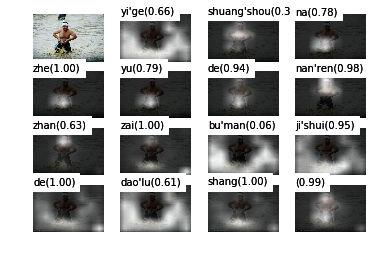

beam search using time(ms): 1322.14403152
一个 戴着 帽子 双手 拿 着 鱼 的 男人 站 在 河水 里 </S> 0.0390955
probs [0.6614434258088167, 0.2845189597708028, 0.5373423540263216, 0.21840645680391274, 0.8003149919299886, 0.9989831069619683, 0.8713399036454761, 0.9653447039436341, 0.9726900089264398, 0.8149017829066371, 0.998851071096114, 0.1683896382732612, 0.9631743406343021, 0.9914937232965715, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


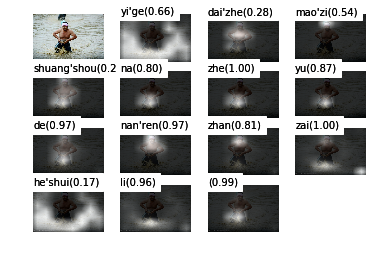

beam search using time(ms): 1240.29707909
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: 3ed33220069cd5d02631f941438c0299a5ffd5b3


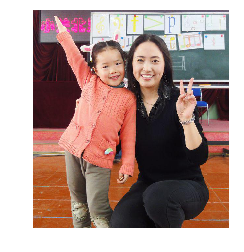

一个 比 着 剪刀手 的 女人 和 一个 比 着 剪刀手 的 女孩 蹲 在 干净 的 屋子里 </S> 0.0155416
probs [0.4472937505728011, 0.3528581873647924, 0.9459157616800101, 0.9880261742830287, 0.9879773006049242, 0.8136897226380173, 0.36234096415916467, 0.985970102758586, 0.36674185993344377, 0.961549737843202, 0.9768783772480472, 0.9946200976148418, 0.43388599901157926, 0.4044045747561529, 0.9918445962918152, 0.1933044015640068, 0.9693530747772519, 0.3549493444346595, 0.9973636221479423, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


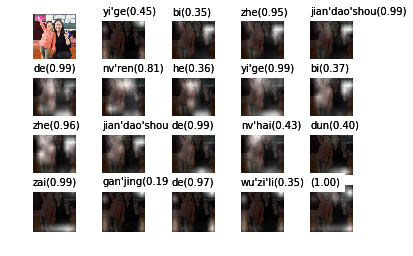

beam search using time(ms): 2269.30093765
一个 右手 比 着 剪刀手 的 女人 搂 着 一个 左手 比 着 剪刀手 的 女孩 蹲 在 教室 里 </S> 0.0153789
probs [0.4472937505728011, 0.13721422395224933, 0.8574538327581009, 0.9856930927600762, 0.9798720281023532, 0.998157683016572, 0.8129556474540145, 0.40630834732711524, 0.9997176729270929, 0.9739971590615413, 0.15821456397786393, 0.8164589670589866, 0.99090566209787, 0.9574799224257474, 0.9985422910332128, 0.4905288355989458, 0.65600617104086, 0.9926091005024326, 0.23907665974233472, 0.9461286026522129, 0.9110461770424851, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


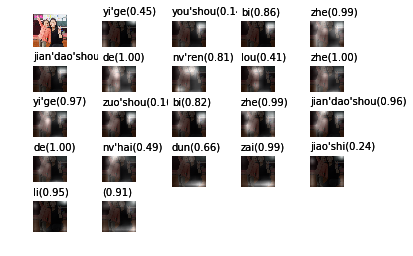

beam search using time(ms): 1479.78305817
一个 比 着 剪刀手 的 女人 搂 着 一个 比 着 剪刀手 的 女孩 蹲 在 教室 里 </S> 0.0150601
probs [0.4472937505728011, 0.3528581873647924, 0.9459157616800101, 0.9880261742830287, 0.9879773006049242, 0.8136897226380173, 0.30155454155077727, 0.9997782007205326, 0.9703356530647157, 0.2650241974778323, 0.9282009784281353, 0.9713595901316817, 0.9932035371025021, 0.4055276121175553, 0.6103303970505601, 0.9919944943746509, 0.11167868960121208, 0.7668128377007924, 0.9064809232806087, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


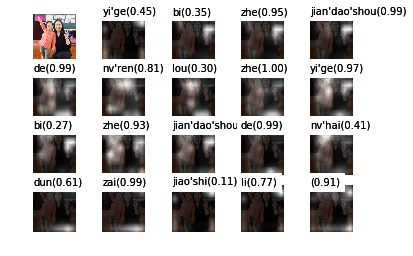

beam search using time(ms): 1356.08005524
一个 右手 比 着 剪刀手 的 女人 搂 着 一个 比 着 剪刀手 的 女孩 蹲 在 教室 里 </S> 0.0150266
probs [0.4472937505728011, 0.13721422395224933, 0.8574538327581009, 0.9856930927600762, 0.9798720281023532, 0.998157683016572, 0.8129556474540145, 0.40630834732711524, 0.9997176729270929, 0.9739971590615413, 0.1462857630917416, 0.9195178763675745, 0.9768774674595854, 0.9944975832423191, 0.46457902026540615, 0.6863074814448288, 0.9917756452195934, 0.2468135417941525, 0.9211569641472246, 0.9098219069306176, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


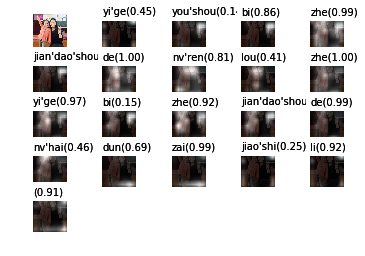

beam search using time(ms): 1875.90885162
一个 左手 比 着 剪刀手 的 女人 搂 着 一个 右手 比 着 剪刀手 的 女孩 蹲 在 教室 里 </S> 0.0142191
probs [0.4472937505728011, 0.11734149712397424, 0.8692911204804672, 0.9905451598687474, 0.9804416763090715, 0.9968523235843404, 0.8511365782671735, 0.4699656553429311, 0.999738284908726, 0.973080633846459, 0.1401912402776009, 0.8441861814771945, 0.9909105781469965, 0.9501201570587097, 0.9983694955926853, 0.47889792470767045, 0.6254144793838037, 0.992904349754178, 0.2275344258482059, 0.9352230990519744, 0.9185089371393882, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


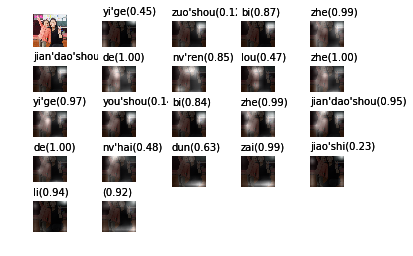

beam search using time(ms): 1484.17115211
一个 左手 比 着 剪刀手 的 女人 搂 着 一个 比 着 剪刀手 的 女孩 蹲 在 教室 里 </S> 0.0139933
probs [0.4472937505728011, 0.11734149712397424, 0.8692911204804672, 0.9905451598687474, 0.9804416763090715, 0.9968523235843404, 0.8511365782671735, 0.4699656553429311, 0.999738284908726, 0.973080633846459, 0.1338211632862127, 0.914934090711725, 0.9764466213790272, 0.9943481075008335, 0.4564463208127287, 0.6452264603063497, 0.9922767005411205, 0.24300935758641964, 0.9102283469452146, 0.9083456066444793, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


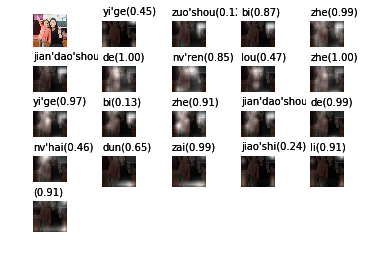

beam search using time(ms): 1411.84282303
一个 比 着 剪刀手 的 女人 搂 着 一个 比 着 剪刀手 的 女孩 蹲 在 干净 的 屋子里 </S> 0.012803
probs [0.4472937505728011, 0.3528581873647924, 0.9459157616800101, 0.9880261742830287, 0.9879773006049242, 0.8136897226380173, 0.30155454155077727, 0.9997782007205326, 0.9703356530647157, 0.2650241974778323, 0.9282009784281353, 0.9713595901316817, 0.9932035371025021, 0.4055276121175553, 0.6103303970505601, 0.9919944943746509, 0.21926600653220318, 0.9310436170494693, 0.24125587832935336, 0.9985698677817183, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


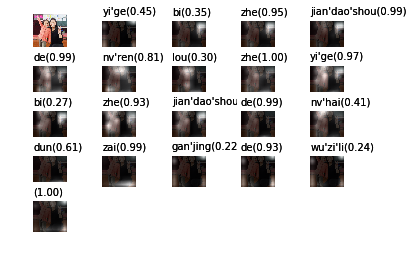

beam search using time(ms): 1416.99910164
一个 右手 比 着 剪刀手 的 女人 搂 着 一个 左手 比 着 剪刀手 的 女孩 蹲 在 房间 里 </S> 0.0118057
probs [0.4472937505728011, 0.13721422395224933, 0.8574538327581009, 0.9856930927600762, 0.9798720281023532, 0.998157683016572, 0.8129556474540145, 0.40630834732711524, 0.9997176729270929, 0.9739971590615413, 0.15821456397786393, 0.8164589670589866, 0.99090566209787, 0.9574799224257474, 0.9985422910332128, 0.4905288355989458, 0.65600617104086, 0.9926091005024326, 0.130063193811831, 0.9914211882246745, 0.9073825186026211, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


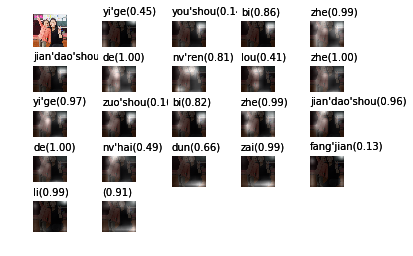

beam search using time(ms): 1480.60297966
一个 比 着 剪刀手 的 女人 搂 着 一个 比 着 剪刀手 的 女孩 蹲 在 干净 的 房屋里 </S> 0.0115179
probs [0.4472937505728011, 0.3528581873647924, 0.9459157616800101, 0.9880261742830287, 0.9879773006049242, 0.8136897226380173, 0.30155454155077727, 0.9997782007205326, 0.9703356530647157, 0.2650241974778323, 0.9282009784281353, 0.9713595901316817, 0.9932035371025021, 0.4055276121175553, 0.6103303970505601, 0.9919944943746509, 0.21926600653220318, 0.9310436170494693, 0.1930759433636111, 0.9976590963179839, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


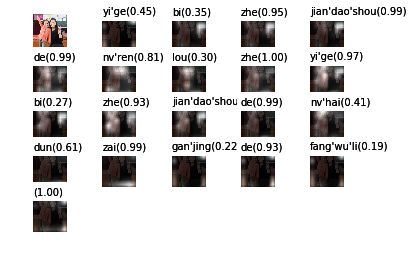

beam search using time(ms): 1417.53602028
一个 比 着 剪刀手 的 女人 搂 着 一个 比 着 剪刀手 的 女孩 蹲 在 干净 的 教室 里 </S> 0.0109923
probs [0.4472937505728011, 0.3528581873647924, 0.9459157616800101, 0.9880261742830287, 0.9879773006049242, 0.8136897226380173, 0.30155454155077727, 0.9997782007205326, 0.9703356530647157, 0.2650241974778323, 0.9282009784281353, 0.9713595901316817, 0.9932035371025021, 0.4055276121175553, 0.6103303970505601, 0.9919944943746509, 0.21926600653220318, 0.9310436170494693, 0.16364372864218962, 0.9507121838569723, 0.9977597231050247, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


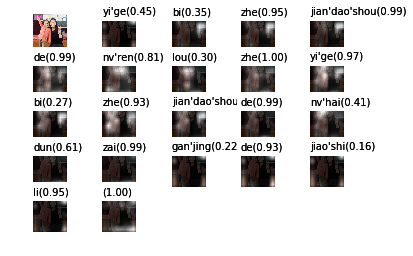

beam search using time(ms): 1480.67688942
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: ac4acd52eaefb4e9324211ac58aad1d97f4bef8e


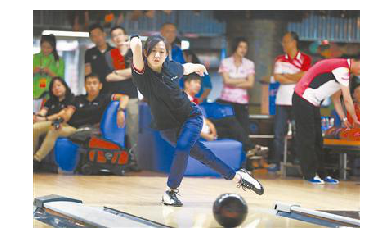

大厅 里 一群 人 的 前面 有 一个 穿着 深色 上衣 的 男人 在 练武 </S> 0.00346989
probs [0.06609678133365375, 0.9787664611759164, 0.4634804044048234, 0.6356828326786064, 0.4832288726557071, 0.6359440407390425, 0.9413380621395173, 0.6622728384168178, 0.4044821019079815, 0.3388469575899045, 0.7446673826973815, 0.9973354005411638, 0.4457587829105767, 0.8851112257648167, 0.08219931167374514, 0.9987874446621595, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


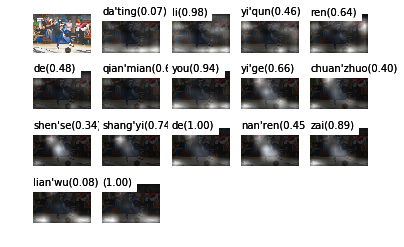

beam search using time(ms): 1573.57692719
室内 一群 人 的 前面 有 一个 穿着 深色 上衣 的 女人 在 打 保龄球 </S> 0.00338615
probs [0.12094162814475855, 0.4976457811638834, 0.5526459791183006, 0.7224670939205158, 0.6748354825384042, 0.9413265495248797, 0.5951899356253627, 0.4723245751426233, 0.3888417540964289, 0.7286836261366438, 0.9969766034388119, 0.2613320936053388, 0.876252789988585, 0.1818510970631598, 0.22785621076762047, 0.9968289873553, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


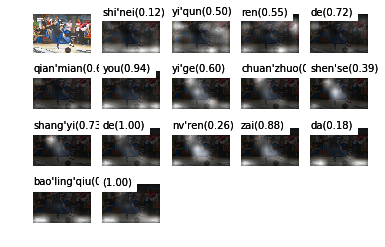

beam search using time(ms): 1310.18805504
室内 一群 人 的 前面 有 一个 穿着 深色 上衣 的 男人 在 打 保龄球 </S> 0.00336839
probs [0.12094162814475855, 0.4976457811638834, 0.5526459791183006, 0.7224670939205158, 0.6748354825384042, 0.9413265495248797, 0.5951899356253627, 0.4723245751426233, 0.3888417540964289, 0.7286836261366438, 0.9969766034388119, 0.44846644010532516, 0.8387801903607397, 0.12949504225215502, 0.19278401653043012, 0.9966674416687927, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


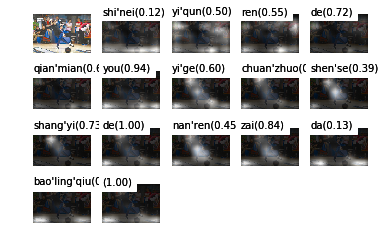

beam search using time(ms): 819.70000267
大厅 里 一群 人 的 前面 有 一个 穿着 黑色 上衣 的 男人 在 练武 </S> 0.00329597
probs [0.06609678133365375, 0.9787664611759164, 0.4634804044048234, 0.6356828326786064, 0.4832288726557071, 0.6359440407390425, 0.9413380621395173, 0.6622728384168178, 0.4044821019079815, 0.3790630537074439, 0.6674543778623504, 0.9980404702022749, 0.41146203792175695, 0.8664671379609523, 0.08180497210882187, 0.9987092011461458, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


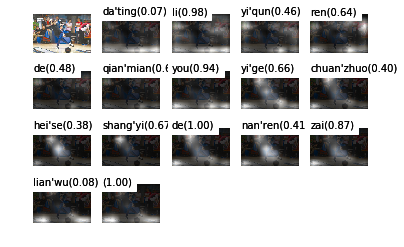

beam search using time(ms): 819.328069687
大厅 里 一群 人 的 前面 有 一个 穿着 黑色 上衣 的 女人 在 打 保龄球 </S> 0.00240863
probs [0.06609678133365375, 0.9787664611759164, 0.4634804044048234, 0.6356828326786064, 0.4832288726557071, 0.6359440407390425, 0.9413380621395173, 0.6622728384168178, 0.4044821019079815, 0.3790630537074439, 0.6674543778623504, 0.9980404702022749, 0.3267531842233299, 0.8991728185144235, 0.15584789213486075, 0.284181276147704, 0.9943682629127187, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


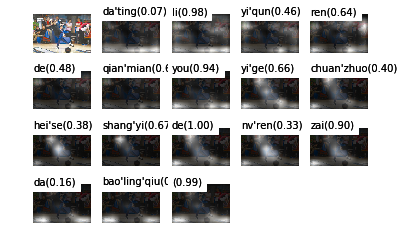

beam search using time(ms): 864.995956421
大厅 里 一群 人 的 前面 有 一个 穿着 深色 上衣 的 女人 在 打 保龄球 </S> 0.00225204
probs [0.06609678133365375, 0.9787664611759164, 0.4634804044048234, 0.6356828326786064, 0.4832288726557071, 0.6359440407390425, 0.9413380621395173, 0.6622728384168178, 0.4044821019079815, 0.3388469575899045, 0.7446673826973815, 0.9973354005411638, 0.265617615214091, 0.9123989685704433, 0.1799232582425924, 0.260804393225469, 0.9959904436659314, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


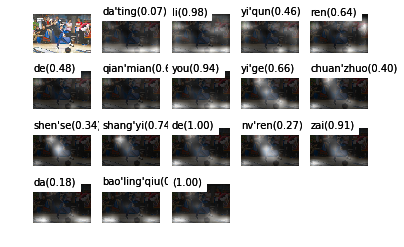

beam search using time(ms): 860.715866089
大厅 里 一群 人 的 前面 有 一个 穿着 深色 上衣 的 男人 在 打 保龄球 </S> 0.00217351
probs [0.06609678133365375, 0.9787664611759164, 0.4634804044048234, 0.6356828326786064, 0.4832288726557071, 0.6359440407390425, 0.9413380621395173, 0.6622728384168178, 0.4044821019079815, 0.3388469575899045, 0.7446673826973815, 0.9973354005411638, 0.4457587829105767, 0.8851112257648167, 0.12020911766683702, 0.22333773030158294, 0.9949513556745774, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


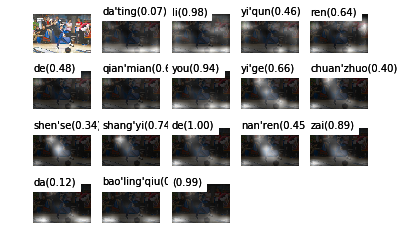

beam search using time(ms): 867.297172546
大厅 里 一群 人 的 前面 有 一个 穿着 黑色 上衣 的 男人 在 打 保龄球 </S> 0.00208249
probs [0.06609678133365375, 0.9787664611759164, 0.4634804044048234, 0.6356828326786064, 0.4832288726557071, 0.6359440407390425, 0.9413380621395173, 0.6622728384168178, 0.4044821019079815, 0.3790630537074439, 0.6674543778623504, 0.9980404702022749, 0.41146203792175695, 0.8664671379609523, 0.11188187292547899, 0.24307538684453642, 0.9931607344420232, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


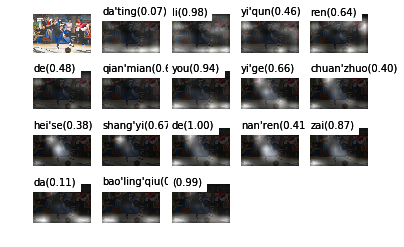

beam search using time(ms): 862.589836121
运动场 上 一群 人 的 前面 有 一个 穿着 深色 上衣 的 男人 在 打 排球 </S> 0.00186032
probs [0.0431169794106223, 0.9185369956098896, 0.4607180165270713, 0.5863678982253017, 0.5313986115846264, 0.6650356448269216, 0.9454205704000107, 0.6118157724988027, 0.4776680096441714, 0.38851931351038455, 0.742017691690676, 0.9978363936087922, 0.48373453776176295, 0.8915750852536355, 0.2030078411205689, 0.10858440524186674, 0.9996749027662231, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


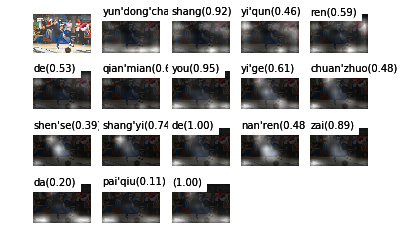

beam search using time(ms): 868.234157562
运动场 上 一群 人 的 前面 有 一个 穿着 深色 上衣 的 男人 在 打 保龄球 </S> 0.00179362
probs [0.0431169794106223, 0.9185369956098896, 0.4607180165270713, 0.5863678982253017, 0.5313986115846264, 0.6650356448269216, 0.9454205704000107, 0.6118157724988027, 0.4776680096441714, 0.38851931351038455, 0.742017691690676, 0.9978363936087922, 0.48373453776176295, 0.8915750852536355, 0.2030078411205689, 0.10103646781428118, 0.9975835206441793, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


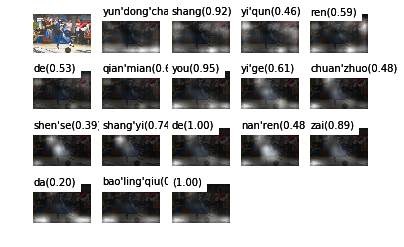

beam search using time(ms): 868.073940277
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: 3dd309ca864a969381ad0316e3e21d58007974e3


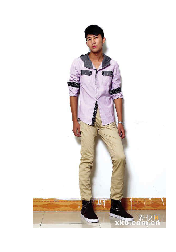

一个 戴着 帽子 的 男人 站 在 室内 的 墙边 </S> 0.0845822
probs [0.403765349948866, 0.33073587604508803, 0.8184840664220495, 0.931974669944471, 0.9305229881811377, 0.6921857477385206, 0.9976277730952705, 0.2650655563949739, 0.991054104861855, 0.6520773048796166, 0.9924549081530145, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


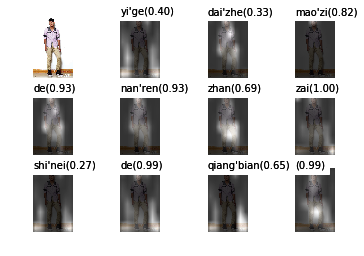

beam search using time(ms): 1462.21399307
明亮 的 房间 里 站 着 一个 戴着 帽子 的 男人 </S> 0.0538772
probs [0.0679164526392674, 0.9947957266187157, 0.8729908982262778, 0.9960882501406053, 0.7494609030359091, 0.9998116847948291, 0.8038069448143725, 0.1631631768898216, 0.8538978586648135, 0.9379772310573936, 0.9431300530502116, 0.9982786059217545, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


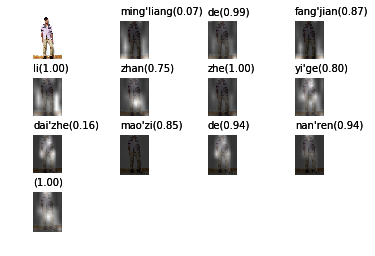

beam search using time(ms): 1333.51397514
房间 里 有 一个 戴着 帽子 的 男人 站 在 墙边 </S> 0.0470052
probs [0.18221481096267184, 0.9847299271324751, 0.34229714222329743, 0.981427469306412, 0.24258851355135197, 0.826765631318106, 0.9514301087211627, 0.9524000259416765, 0.5212328546330385, 0.9942512311857356, 0.6052636627114043, 0.982881203903489, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


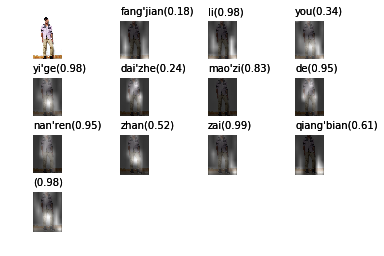

beam search using time(ms): 886.75403595
一个 戴着 帽子 的 男人 站 在 房屋里 的 墙边 </S> 0.0375929
probs [0.403765349948866, 0.33073587604508803, 0.8184840664220495, 0.931974669944471, 0.9305229881811377, 0.6921857477385206, 0.9976277730952705, 0.06998865236152549, 0.9285997504904087, 0.603185155232706, 0.9903533723790836, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


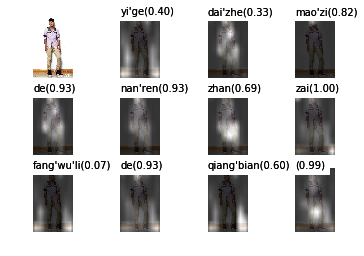

beam search using time(ms): 826.293945312
一个 戴着 帽子 的 男人 站 在 墙边 的 地上 </S> 0.0374904
probs [0.403765349948866, 0.33073587604508803, 0.8184840664220495, 0.931974669944471, 0.9305229881811377, 0.6921857477385206, 0.9976277730952705, 0.15148303261197976, 0.9829833637285593, 0.260966579581987, 0.9941271586702907, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


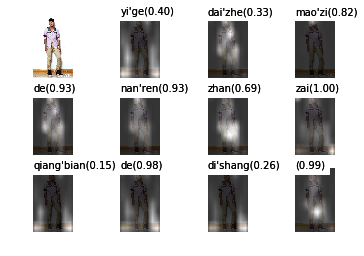

beam search using time(ms): 828.546047211
一个 戴着 帽子 的 男人 站 在 室内 的 地板 上 </S> 0.0357854
probs [0.403765349948866, 0.33073587604508803, 0.8184840664220495, 0.931974669944471, 0.9305229881811377, 0.6921857477385206, 0.9976277730952705, 0.2650655563949739, 0.991054104861855, 0.11876737493905848, 0.9959364038327457, 0.999589611694703, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


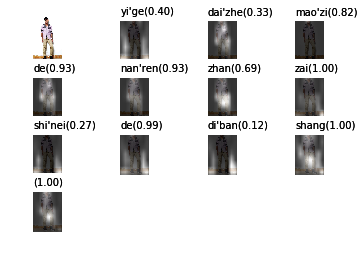

beam search using time(ms): 884.196043015
一个 戴着 帽子 的 男人 站 在 房间 里 的 墙边 </S> 0.0349494
probs [0.403765349948866, 0.33073587604508803, 0.8184840664220495, 0.931974669944471, 0.9305229881811377, 0.6921857477385206, 0.9976277730952705, 0.09607007990605089, 0.9458317190021083, 0.8724250004367932, 0.379149281907052, 0.9888982176354117, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


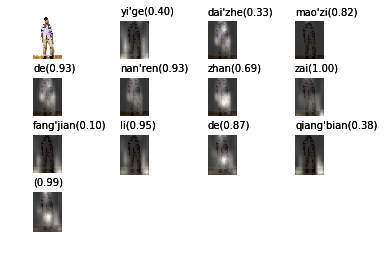

beam search using time(ms): 882.431983948
一个 戴着 帽子 的 男人 站 在 干净 的 房间 里 </S> 0.0341252
probs [0.403765349948866, 0.33073587604508803, 0.8184840664220495, 0.931974669944471, 0.9305229881811377, 0.6921857477385206, 0.9976277730952705, 0.08467101181682021, 0.9585461134937996, 0.3509725103646604, 0.9987111035930211, 0.9994038323181053, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


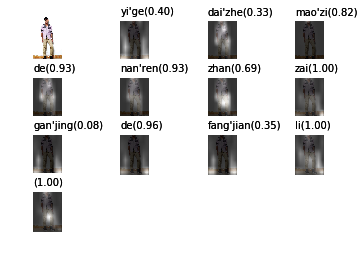

beam search using time(ms): 883.445978165
一个 戴着 帽子 的 男人 站 在 墙边 的 地板 上 </S> 0.0311601
probs [0.403765349948866, 0.33073587604508803, 0.8184840664220495, 0.931974669944471, 0.9305229881811377, 0.6921857477385206, 0.9976277730952705, 0.15148303261197976, 0.9829833637285593, 0.16167802163392694, 0.9975559984256146, 0.9996123625071198, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


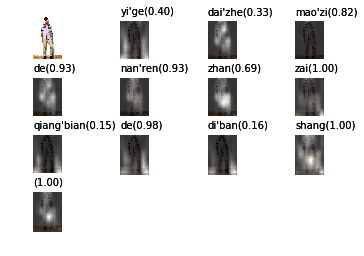

beam search using time(ms): 881.142854691
一个 穿着 浅色 上衣 的 男人 站 在 室内 的 墙边 </S> 0.0301603
probs [0.403765349948866, 0.3662473378702404, 0.17991422864066403, 0.403821332020601, 0.9522444532189837, 0.9527931365946485, 0.8356696342873408, 0.9975964520173587, 0.31831020030720536, 0.8242172682088641, 0.6962950754349885, 0.9961632444849551, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


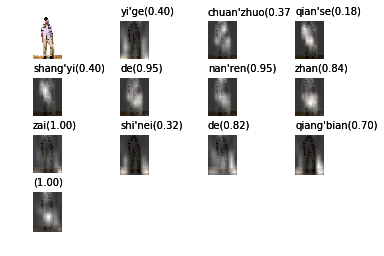

beam search using time(ms): 879.285097122
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: 0d5bb5c1fcebec433bdd5a636c85e907d0d40535


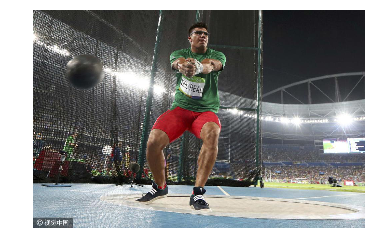

一个 穿着 运动服 的 男人 在 运动场 上 腾空 跃起 </S> 0.100461
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.36770665060032776, 0.49414292375598234, 0.8945706333967273, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


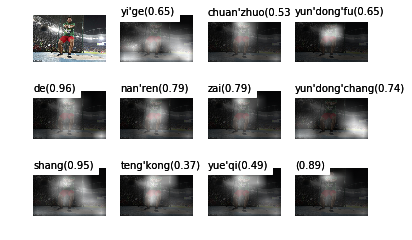

beam search using time(ms): 1678.92503738
一个 穿着 运动服 的 男人 在 运动场 上 腾空 跳 起 </S> 0.0898653
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.36770665060032776, 0.33390896826951366, 0.9903584000587502, 0.9907908483259076, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


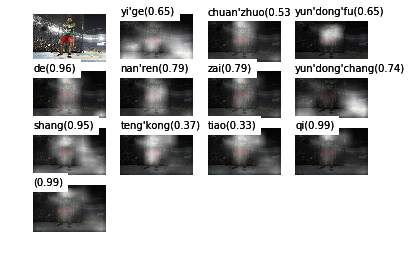

beam search using time(ms): 1130.78784943
一个 穿着 运动服 的 男人 在 运动场 上 呐喊 </S> 0.0659481
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.08501170746027228, 0.9982114888291278, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


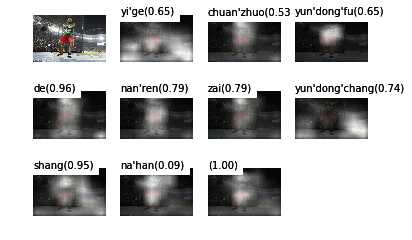

beam search using time(ms): 953.898191452
一个 穿着 运动服 的 男人 站 在 运动场 上 </S> 0.0608179
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.07171578972397519, 0.9998098973284485, 0.7506012017820661, 0.9847928156876815, 0.7681008967801456, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


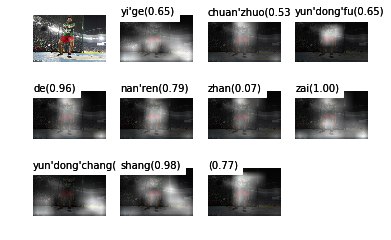

beam search using time(ms): 954.576969147
一个 穿着 运动服 的 男人 在 运动场 上 跑步 </S> 0.0581553
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.06789686248674595, 0.9993865678963391, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


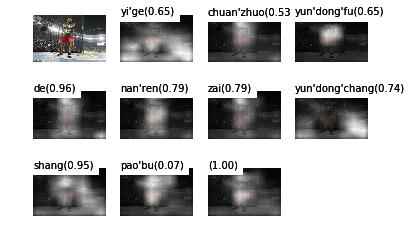

beam search using time(ms): 953.665018082
一个 穿着 运动服 的 男人 在 运动场 上 腾空 跳跃 </S> 0.0536061
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.36770665060032776, 0.1544231923626007, 0.9119475636182038, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


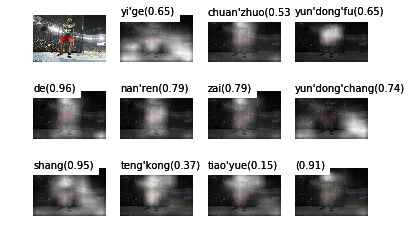

beam search using time(ms): 1500.45490265
一个 穿着 运动服 的 男人 在 运动场 上 奔跑 </S> 0.0509908
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.054841377892510035, 0.9793544909533539, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


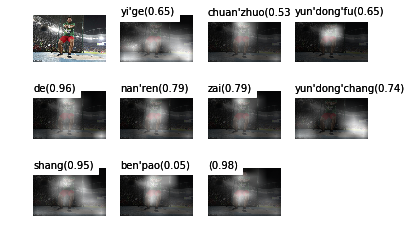

beam search using time(ms): 962.998151779
运动场 上 有 一个 穿着 运动服 的 男人 在 跑步 </S> 0.0459973
probs [0.15389459190485086, 0.9589041950389191, 0.650482453315339, 0.9657581348463621, 0.6774730392995576, 0.7114513358789132, 0.9895503136853855, 0.8490017815325286, 0.9239342617654501, 0.10584532857528933, 0.9995902072639825, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


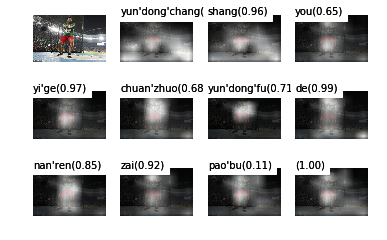

beam search using time(ms): 1048.38180542
一个 穿着 运动服 的 男人 在 运动场 上 跳跃 </S> 0.0448933
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.044876401021434496, 0.9542732833132008, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


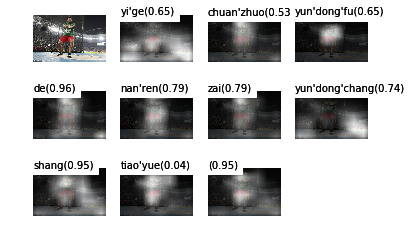

beam search using time(ms): 962.068080902
一个 双手 拿 着 东西 的 男人 站 在 运动场 上 </S> 0.0431456
probs [0.6496119895450438, 0.31017262467692475, 0.29911681370004467, 0.9978550289549611, 0.23620405540220743, 0.9944011498616186, 0.7971125057208964, 0.40479479605401647, 0.9995737701243124, 0.6889703898580125, 0.9832454825687961, 0.9330046013034708, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


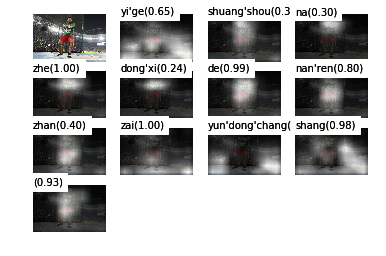

beam search using time(ms): 1129.05597687
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: 0aa9bd2851ea3cb45d99247ae9d9e7185036474c


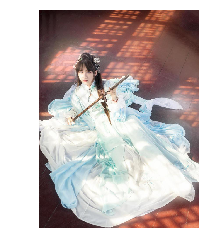

舞台 上 有 两个 穿着 裙子 的 女人 在 表演 </S> 0.0895495
probs [0.4874159533334294, 0.9921199126101137, 0.8095796048645133, 0.6249023457412647, 0.6421064296957837, 0.17640127022182986, 0.9864106730571451, 0.6555581482686909, 0.9768437949650707, 0.9513776679142076, 0.7413911392755831, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


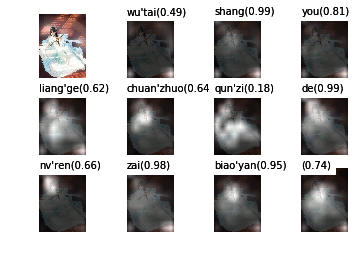

beam search using time(ms): 1734.05694962
舞台 上 有 两个 穿着 演出服 的 人 在 表演 </S> 0.0701907
probs [0.4874159533334294, 0.9921199126101137, 0.8095796048645133, 0.6249023457412647, 0.6421064296957837, 0.09827914529101925, 0.9867174497250748, 0.7041852282877927, 0.9881914499108971, 0.959445985905775, 0.77901275468565, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


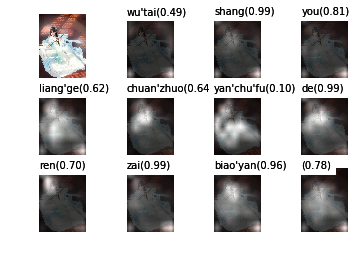

beam search using time(ms): 1100.29196739
舞台 上 有 两个 穿着 演出 服饰 的 人 在 表演 </S> 0.0647052
probs [0.4874159533334294, 0.9921199126101137, 0.8095796048645133, 0.6249023457412647, 0.6421064296957837, 0.15382207023858702, 0.5479822884576999, 0.9984683643441105, 0.5794413124146452, 0.9914803636283309, 0.9665968669338291, 0.8338873259956205, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


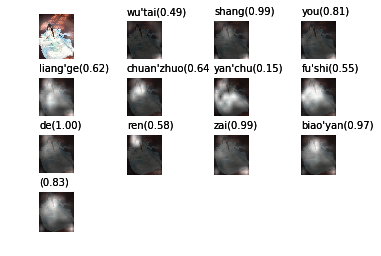

beam search using time(ms): 1185.56308746
舞台 上 有 两个 穿着 演出 服装 的 人 在 表演 </S> 0.0581759
probs [0.4874159533334294, 0.9921199126101137, 0.8095796048645133, 0.6249023457412647, 0.6421064296957837, 0.15382207023858702, 0.42086361682137885, 0.998014703931351, 0.6364008678618408, 0.992240785352712, 0.9621524600342946, 0.8145098045807789, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


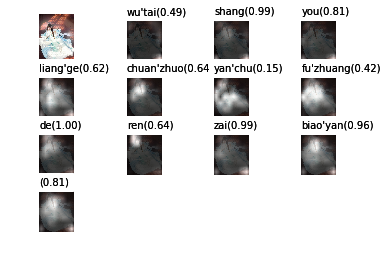

beam search using time(ms): 1179.24690247
舞台 上 有 一个 右手 拿 着 剑 的 女人 在 表演 </S> 0.0521202
probs [0.4874159533334294, 0.9921199126101137, 0.8095796048645133, 0.27787372151270767, 0.148636376160964, 0.9532844903027982, 0.9727380584213764, 0.5991860846981001, 0.9589097855427302, 0.6873898977509819, 0.7298865373640913, 0.945954376387022, 0.8958440007727914, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


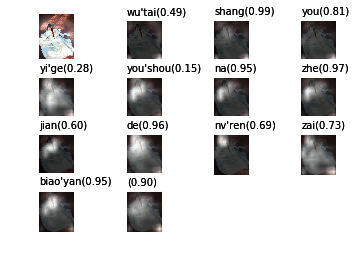

beam search using time(ms): 1266.02602005
舞台 上 有 两个 穿着 古装 的 人 在 表演 </S> 0.0520795
probs [0.4874159533334294, 0.9921199126101137, 0.8095796048645133, 0.6249023457412647, 0.6421064296957837, 0.09638753825519084, 0.6373002552376852, 0.7287104464636792, 0.9768954413974184, 0.9564857864505008, 0.7002546447668909, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


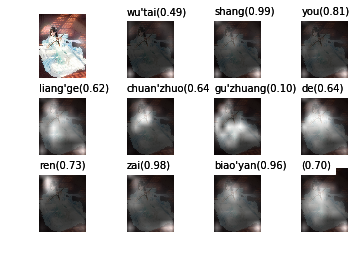

beam search using time(ms): 1105.88598251
舞台 上 有 两个 穿着 裙子 的 女人 在 表演 节目 </S> 0.0505514
probs [0.4874159533334294, 0.9921199126101137, 0.8095796048645133, 0.6249023457412647, 0.6421064296957837, 0.17640127022182986, 0.9864106730571451, 0.6555581482686909, 0.9768437949650707, 0.9513776679142076, 0.2322754153645637, 0.9997263703712387, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


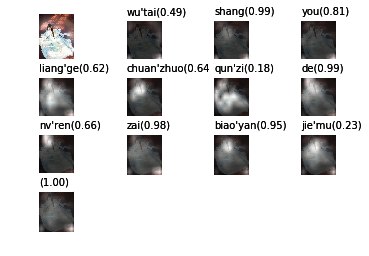

beam search using time(ms): 1177.61111259
舞台 上 有 两个 手里 拿 着 剑 的 女人 在 表演 </S> 0.0463752
probs [0.4874159533334294, 0.9921199126101137, 0.8095796048645133, 0.6249023457412647, 0.07716575362907374, 0.9838914118629601, 0.9955066601365885, 0.37420169205436815, 0.9816009959448998, 0.5622659769312053, 0.9812246186442505, 0.9291415870293721, 0.8427918310216623, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


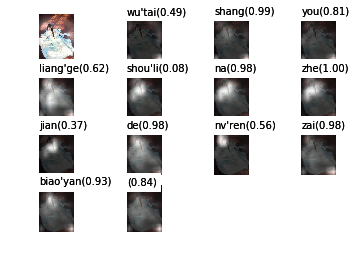

beam search using time(ms): 1265.47288895
灯光 绚丽 的 舞台 上 有 两个 穿着 裙子 的 女人 在 表演 </S> 0.0385553
probs [0.059408129394103754, 0.5906668032204537, 0.9984658686222596, 0.9954693291684283, 0.9878304760382619, 0.9344135572430968, 0.5384888361702102, 0.5709034048107421, 0.47023526542042005, 0.997517564747851, 0.439519488147836, 0.9945971017184001, 0.9653389284809589, 0.9396382216829591, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


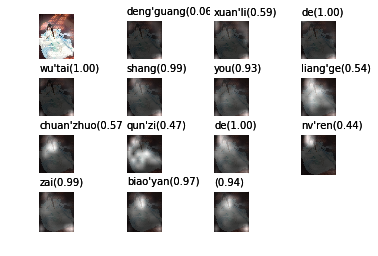

beam search using time(ms): 1358.91413689
绚丽 的 舞台 上 有 两个 穿着 裙子 的 女孩 在 表演 </S> 0.0380683
probs [0.05497378007049415, 0.9966685074967006, 0.9970392884403642, 0.9961369832631194, 0.8956012599700629, 0.5906903216206248, 0.5641825310026293, 0.4819923739246932, 0.9975059403378648, 0.3264528075773165, 0.9943061491231242, 0.9330871114265894, 0.8528718594422774, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


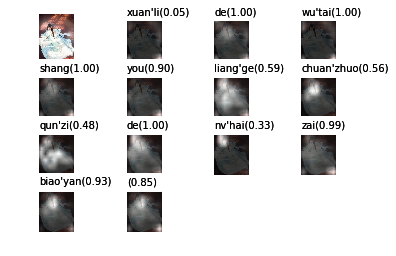

beam search using time(ms): 1729.79402542
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: e2aa815c9f9dda30f50716ef9b15629322161ae1


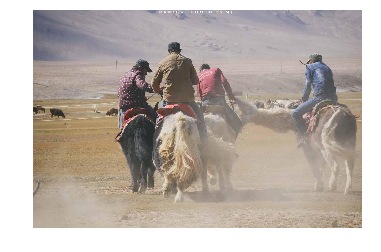

一望无际 的 沙漠 上 有 一群 人 在 骑骆驼 </S> 0.0373177
probs [0.19985096640346386, 0.9902688464342427, 0.811617319273379, 0.48877947806019584, 0.6279070238449583, 0.4053968663075751, 0.4236348065898809, 0.5540949412361128, 0.633544252046587, 0.9714352941194552, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


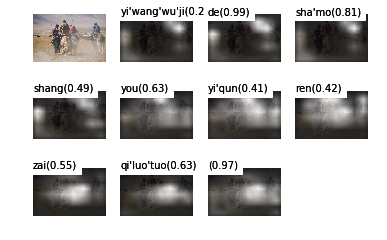

beam search using time(ms): 1600.15296936
一望无际 的 沙漠 里 有 一群 人 在 骑骆驼 </S> 0.0368313
probs [0.19985096640346386, 0.9902688464342427, 0.811617319273379, 0.49900859569815514, 0.6317821935916609, 0.4150305635649297, 0.40096966610502666, 0.5701255334130574, 0.6109986906004492, 0.9608279102335365, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


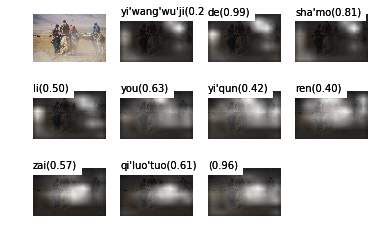

beam search using time(ms): 964.226961136
一望无际 的 沙漠 里 有 一群 戴着 帽子 的 人 在 骑骆驼 </S> 0.0292854
probs [0.19985096640346386, 0.9902688464342427, 0.811617319273379, 0.49900859569815514, 0.6317821935916609, 0.4150305635649297, 0.20737340943859073, 0.901558900825815, 0.9885348635008206, 0.9869384843289515, 0.4932314815315179, 0.6495084801615916, 0.9981662345060022, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


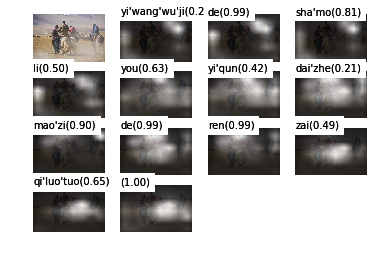

beam search using time(ms): 1223.97613525
一望无际 的 沙漠 上 有 一群 戴着 帽子 的 人 在 骑骆驼 </S> 0.0277903
probs [0.19985096640346386, 0.9902688464342427, 0.811617319273379, 0.48877947806019584, 0.6279070238449583, 0.4053968663075751, 0.19506509714435358, 0.9014357639584628, 0.9885871713209463, 0.9875399807701993, 0.4983591885417279, 0.6501462338561265, 0.998348464808862, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


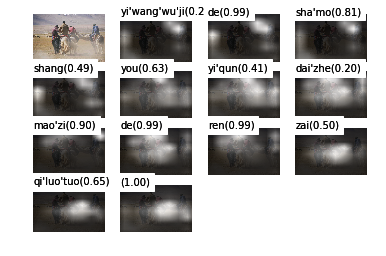

beam search using time(ms): 1222.98383713
一望无际 的 沙漠 上 有 四个 人 在 骑骆驼 </S> 0.0251449
probs [0.19985096640346386, 0.9902688464342427, 0.811617319273379, 0.48877947806019584, 0.6279070238449583, 0.27323374146907287, 0.36234973273027093, 0.4872535492391371, 0.624512602120062, 0.9633330663168342, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


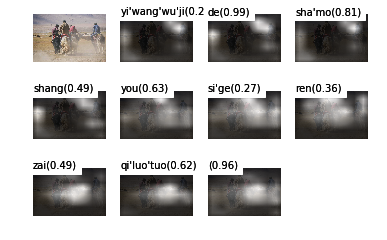

beam search using time(ms): 958.313941956
一望无际 的 沙漠 里 有 四个 人 在 骑骆驼 </S> 0.0242683
probs [0.19985096640346386, 0.9902688464342427, 0.811617319273379, 0.49900859569815514, 0.6317821935916609, 0.26969594325684704, 0.3422350834459419, 0.5037516922934369, 0.6015084299796336, 0.9484279393078147, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


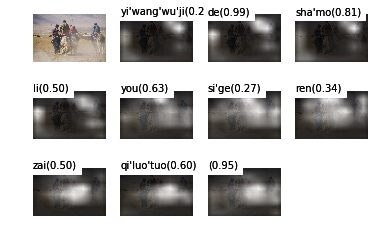

beam search using time(ms): 959.148168564
一望无际 的 沙漠 里 有 四个 戴着 帽子 的 人 在 骑骆驼 </S> 0.0233808
probs [0.19985096640346386, 0.9902688464342427, 0.811617319273379, 0.49900859569815514, 0.6317821935916609, 0.26969594325684704, 0.2216552108237674, 0.8969737540643811, 0.9870603041916354, 0.9823611734870076, 0.4768213715606422, 0.6380712113364589, 0.9979003738387864, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


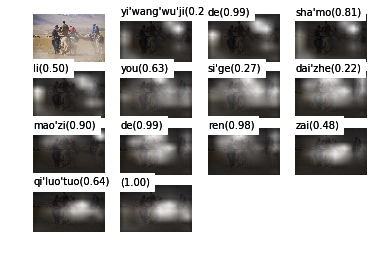

beam search using time(ms): 1217.45085716
一望无际 的 沙漠 里 有 一群 戴着 帽子 的 人 骑 着 骆驼 </S> 0.0229895
probs [0.19985096640346386, 0.9902688464342427, 0.811617319273379, 0.49900859569815514, 0.6317821935916609, 0.4150305635649297, 0.20737340943859073, 0.901558900825815, 0.9885348635008206, 0.9869384843289515, 0.33620137261557237, 0.6457462438118543, 0.8421083942328015, 0.9660979245981974, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


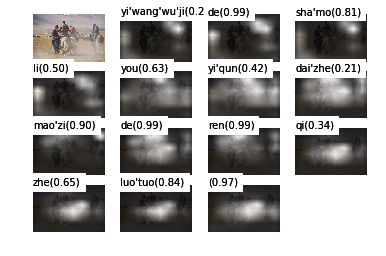

beam search using time(ms): 1311.04397774
一望无际 的 沙漠 上 有 四个 戴着 帽子 的 人 在 骑骆驼 </S> 0.0226887
probs [0.19985096640346386, 0.9902688464342427, 0.811617319273379, 0.48877947806019584, 0.6279070238449583, 0.27323374146907287, 0.20934885679635185, 0.8974066212238079, 0.9871353389061758, 0.9830400387327357, 0.4825796070506471, 0.6383564771122681, 0.9980917696809843, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


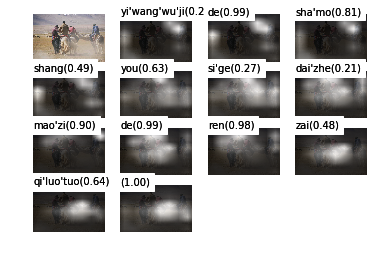

beam search using time(ms): 1220.69311142
一望无际 的 沙漠 上 有 一群 戴着 帽子 的 人 骑 着 骆驼 </S> 0.0215286
probs [0.19985096640346386, 0.9902688464342427, 0.811617319273379, 0.48877947806019584, 0.6279070238449583, 0.4053968663075751, 0.19506509714435358, 0.9014357639584628, 0.9885871713209463, 0.9875399807701993, 0.33984882628936686, 0.6263132539807686, 0.845490975983735, 0.965881012317632, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


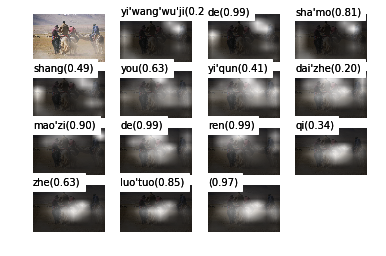

beam search using time(ms): 1305.96899986
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: 4c0327094e022f21402de8c3ba97a0f2bdd6a95f


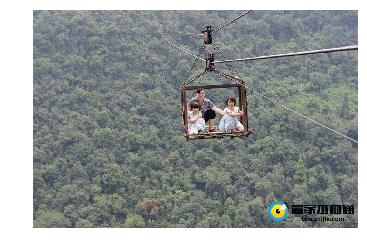

山间 的 索道 上 有 两个 双手 抓 着 绳子 的 人 在 滑 索道 </S> 0.00528382
probs [0.038961907860543765, 0.7142337916631961, 0.7017391407222742, 0.9439647642279009, 0.5698034058945584, 0.5440838022923609, 0.13455315471663531, 0.6352813481776352, 0.9769854379724076, 0.5360279616129866, 0.9292453355684366, 0.772388504581931, 0.6285241664327751, 0.3362354008369515, 0.7220055049145149, 0.9965174312057578, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


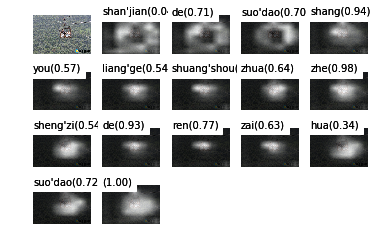

beam search using time(ms): 1963.95516396
室外 的 索道 上 有 两个 双手 抓 着 绳子 的 人 在 滑 索道 </S> 0.00466022
probs [0.07582047155294457, 0.35447600570009324, 0.4288992232485942, 0.9313444182035251, 0.5132890552479787, 0.5154651239032407, 0.12705306998844323, 0.6237774546152753, 0.976298089802647, 0.5751625670206256, 0.93327832604051, 0.81089420028532, 0.7529532011448449, 0.3925429748466713, 0.7715210617345521, 0.9955105587587798, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


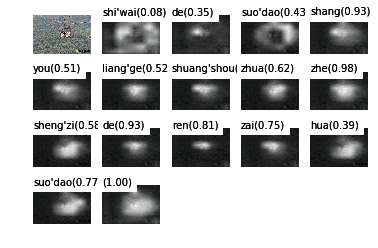

beam search using time(ms): 1329.49590683
山间 的 索道 上 有 两个 穿着 短袖 的 人 在 玩 滑索 </S> 0.00392922
probs [0.038961907860543765, 0.7142337916631961, 0.7017391407222742, 0.9439647642279009, 0.5698034058945584, 0.5440838022923609, 0.15744558535578054, 0.327484429420523, 0.8204890634213567, 0.6460259304028544, 0.8576758884391412, 0.6177170901471947, 0.26924968143920297, 0.9969283805144119, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


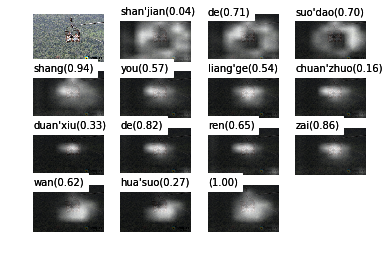

beam search using time(ms): 1650.75707436
陡峭 的 索道 上 有 两个 双手 抓 着 绳子 的 人 在 滑 索道 </S> 0.00374032
probs [0.025103214371523234, 0.9949225622808862, 0.310510875592999, 0.9257434949502962, 0.5570640688579411, 0.6379680958799379, 0.13529314981820598, 0.7115413054806821, 0.9708154984263974, 0.475875898584653, 0.931589753102612, 0.7879039001945864, 0.5993690054094025, 0.3784986489367002, 0.7441234579454025, 0.9949952566867006, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


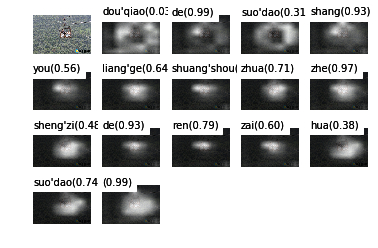

beam search using time(ms): 1335.51001549
山间 的 索道 上 有 两个 双手 抓 着 绳子 的 人 在 玩 滑索 </S> 0.00329194
probs [0.038961907860543765, 0.7142337916631961, 0.7017391407222742, 0.9439647642279009, 0.5698034058945584, 0.5440838022923609, 0.13455315471663531, 0.6352813481776352, 0.9769854379724076, 0.5360279616129866, 0.9292453355684366, 0.772388504581931, 0.6285241664327751, 0.3362296290233027, 0.27994146178437673, 0.997638688609915, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


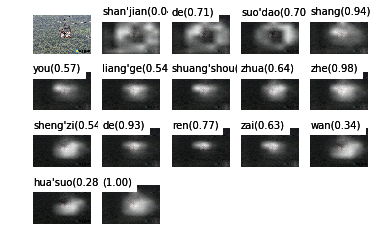

beam search using time(ms): 1343.50204468
山间 的 索道 上 有 两个 双手 抓 着 绳索 的 人 在 滑 索道 </S> 0.00307176
probs [0.038961907860543765, 0.7142337916631961, 0.7017391407222742, 0.9439647642279009, 0.5698034058945584, 0.5440838022923609, 0.13455315471663531, 0.6352813481776352, 0.9769854379724076, 0.1583584606601039, 0.9494199993904243, 0.7796091797618213, 0.6854605522266942, 0.34067305110634744, 0.7251487091645854, 0.9960900243291787, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


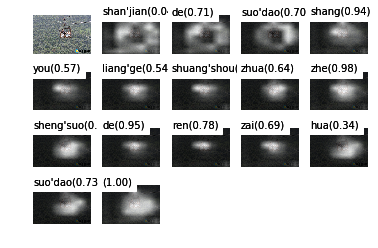

beam search using time(ms): 1333.24480057
山间 的 索道 上 有 两个 双手 抓 着 绳子 的 人 在 玩 滑 索道 </S> 0.00298733
probs [0.038961907860543765, 0.7142337916631961, 0.7017391407222742, 0.9439647642279009, 0.5698034058945584, 0.5440838022923609, 0.13455315471663531, 0.6352813481776352, 0.9769854379724076, 0.5360279616129866, 0.9292453355684366, 0.772388504581931, 0.6285241664327751, 0.3362296290233027, 0.2650386992205245, 0.7364499187448226, 0.9865911891719804, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


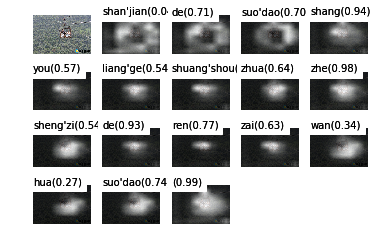

beam search using time(ms): 1402.62007713
室外 的 索道 上 有 两个 双手 抓 着 绳子 的 人 在 玩 滑 索道 </S> 0.00283902
probs [0.07582047155294457, 0.35447600570009324, 0.4288992232485942, 0.9313444182035251, 0.5132890552479787, 0.5154651239032407, 0.12705306998844323, 0.6237774546152753, 0.976298089802647, 0.5751625670206256, 0.93327832604051, 0.81089420028532, 0.7529532011448449, 0.3427299894642552, 0.35796923728978647, 0.7691257088067465, 0.9913405799200508, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


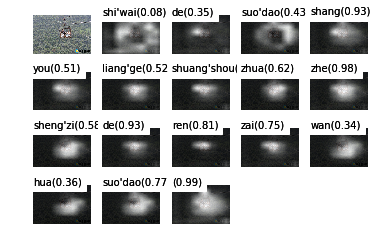

beam search using time(ms): 1405.45606613
山间 的 索道 上 有 两个 双手 抓 着 铁链 的 人 在 滑 索道 </S> 0.00282379
probs [0.038961907860543765, 0.7142337916631961, 0.7017391407222742, 0.9439647642279009, 0.5698034058945584, 0.5440838022923609, 0.13455315471663531, 0.6352813481776352, 0.9769854379724076, 0.13719664107798082, 0.8990760581715954, 0.7873511080340607, 0.6532024393874158, 0.3598728998219717, 0.7342729462796175, 0.9966669680452178, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


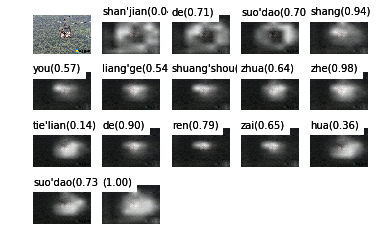

beam search using time(ms): 1329.09202576
室外 的 索道 上 有 两个 双手 抓 着 绳子 的 人 在 玩 滑索 </S> 0.00251974
probs [0.07582047155294457, 0.35447600570009324, 0.4288992232485942, 0.9313444182035251, 0.5132890552479787, 0.5154651239032407, 0.12705306998844323, 0.6237774546152753, 0.976298089802647, 0.5751625670206256, 0.93327832604051, 0.81089420028532, 0.7529532011448449, 0.3427299894642552, 0.25801931541393286, 0.9967265347631754, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


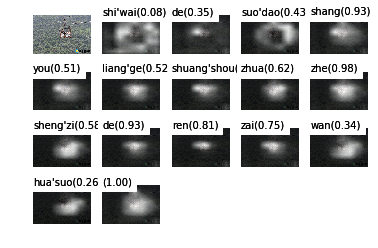

beam search using time(ms): 1328.69195938
image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: 0d5bb5c1fcebec433bdd5a636c85e907d0d40535


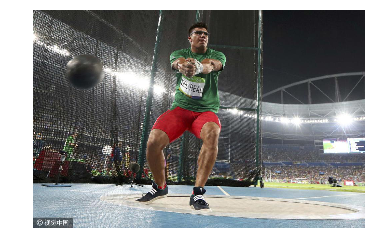

一个 穿着 运动服 的 男人 在 运动场 上 腾空 跃起 </S> 0.100461
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.36770665060032776, 0.49414292375598234, 0.8945706333967273, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


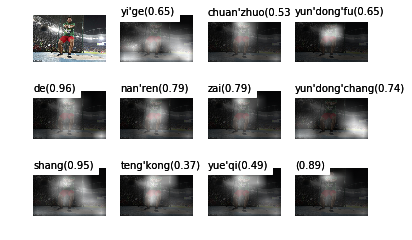

beam search using time(ms): 1674.59797859
一个 穿着 运动服 的 男人 在 运动场 上 腾空 跳 起 </S> 0.0898653
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.36770665060032776, 0.33390896826951366, 0.9903584000587502, 0.9907908483259076, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


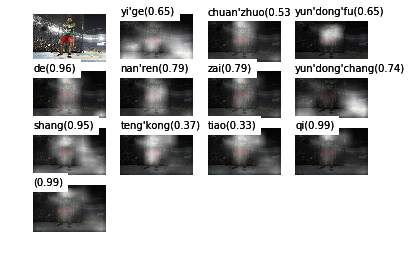

beam search using time(ms): 1124.44400787
一个 穿着 运动服 的 男人 在 运动场 上 呐喊 </S> 0.0659481
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.08501170746027228, 0.9982114888291278, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


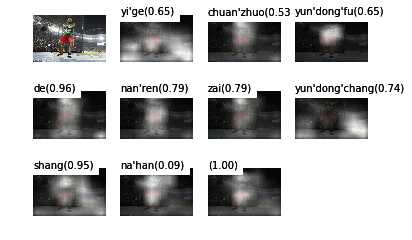

beam search using time(ms): 950.242996216
一个 穿着 运动服 的 男人 站 在 运动场 上 </S> 0.0608179
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.07171578972397519, 0.9998098973284485, 0.7506012017820661, 0.9847928156876815, 0.7681008967801456, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


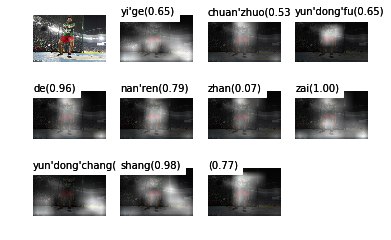

beam search using time(ms): 1389.14489746
一个 穿着 运动服 的 男人 在 运动场 上 跑步 </S> 0.0581553
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.06789686248674595, 0.9993865678963391, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


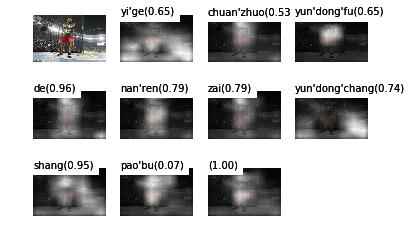

beam search using time(ms): 948.449134827
一个 穿着 运动服 的 男人 在 运动场 上 腾空 跳跃 </S> 0.0536061
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.36770665060032776, 0.1544231923626007, 0.9119475636182038, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


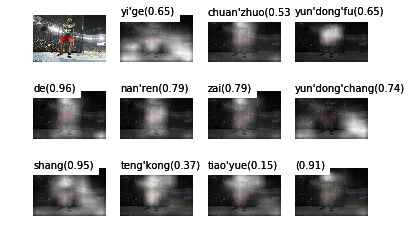

beam search using time(ms): 1038.71893883
一个 穿着 运动服 的 男人 在 运动场 上 奔跑 </S> 0.0509908
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.054841377892510035, 0.9793544909533539, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


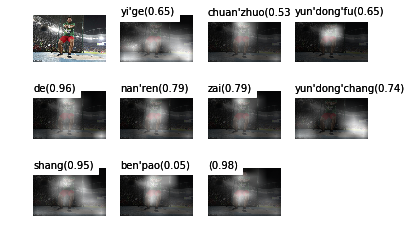

beam search using time(ms): 948.292016983
运动场 上 有 一个 穿着 运动服 的 男人 在 跑步 </S> 0.0459973
probs [0.15389459190485086, 0.9589041950389191, 0.650482453315339, 0.9657581348463621, 0.6774730392995576, 0.7114513358789132, 0.9895503136853855, 0.8490017815325286, 0.9239342617654501, 0.10584532857528933, 0.9995902072639825, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


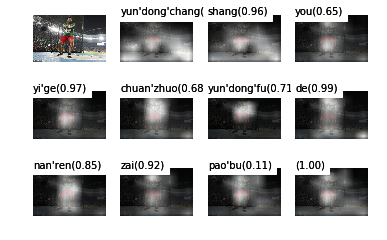

beam search using time(ms): 1035.52293777
一个 穿着 运动服 的 男人 在 运动场 上 跳跃 </S> 0.0448933
probs [0.6496119895450438, 0.5306137126230591, 0.6485364292157322, 0.9624802209748207, 0.7856068678211424, 0.793614452808773, 0.7379736028478071, 0.9460119807037621, 0.044876401021434496, 0.9542732833132008, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


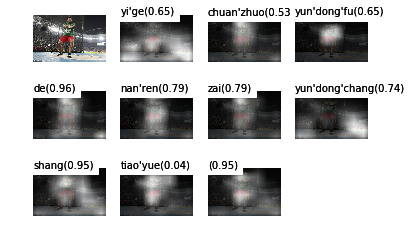

beam search using time(ms): 945.161104202
一个 双手 拿 着 东西 的 男人 站 在 运动场 上 </S> 0.0431456
probs [0.6496119895450438, 0.31017262467692475, 0.29911681370004467, 0.9978550289549611, 0.23620405540220743, 0.9944011498616186, 0.7971125057208964, 0.40479479605401647, 0.9995737701243124, 0.6889703898580125, 0.9832454825687961, 0.9330046013034708, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]


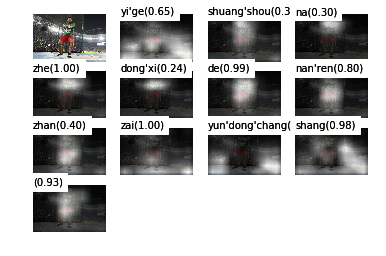

beam search using time(ms): 1116.57786369


In [ ]:
while True:
  image_name = raw_input('image_name like 6275b5349168ac3fab6a493c509301d023cf39d3.jpg: ')
  image_name = image_name.strip().replace('file://', '')
  if image_name == 'q':
    break
  if not image_name.endswith('.jpg'):
    image_name += '.jpg'

  image_path = os.path.join(image_dir, image_name)

  if not os.path.exists(image_path):
    print('path not exists:%s'%image_path)
    image_path = image_name
    if not os.path.exists(image_path):
        continue
  plt.subplot(1, 1, 1)
  image_show(image_path)
  predict(image_path, predictor)
  #predict(image_path, predictor2, gen_feature=False)

In [ ]:
import glob 
for img in glob.glob('/home/gezi/new2/data/ai_challenger/image_caption/test_pic/*.jpg'):
    image_show(img)
    predict(img, predictor)